In [1]:
import plons
import os
import math                     as math
import numpy                    as np
import matplotlib.pyplot        as plt

# import necessary plons scripts
import plons.SmoothingKernelScript        as sk
import plons.ConversionFactors_cgs        as cgs
import plons.GeometricalFunctions         as gf


'''
All used definitions
'''

In [2]:
# Definitions for coordinate transformation

'''
calculate new radii after change coordinate center to position second sink particle, and rotation such that AGB is on -x axis
'''

def calc_new_position(x,y,dumpData):
    # translation with rcomp:
    tr_x = x - dumpData['posComp'][0]
    tr_y = y - dumpData['posComp'][1]
    
    # rotation 
    theta   = - (gf.calcPhi([dumpData['posAGB'][0]],[dumpData['posAGB'][1]], 0)-np.pi)
    # print('theta rotation is ',theta)
    final_x = tr_x * np.cos(theta) - tr_y * np.sin(theta)
    final_y = tr_x * np.sin(theta) + tr_y * np.cos(theta)
        
    final_rxy = gf.calc_r_2D(final_x,final_y)
     
    return final_x,final_y,final_rxy


'''
Calculate velocities with velocity of companion as (0,0,0)
'''
def calc_new_velocities(vx,vy,vz,dumpData):
    new_vx = vx - dumpData['velComp'][0]/cgs.kms
    new_vy = vy - dumpData['velComp'][1]/cgs.kms
    new_vz = vz - dumpData['velComp'][2]/cgs.kms
    return (new_vx,new_vy,new_vz)


In [3]:
'''
Perform a coordinate transformation (just a rotation) of two dimensions (x,y) with a given angle alpha. ---> input is array OR floats
  Can also input (x,z) or (y,z) if this is needed.
'''
def coordTransf(x,y,alpha):
    x_transf = x*np.cos(alpha)+y*np.sin(alpha)
    y_transf = -x*np.sin(alpha) +y*np.cos(alpha)
    
    return x_transf, y_transf

### Still remove because will be in plons in pq.getRadTanVelocity()
'''
Get the radial and tangential velocity    !! No absolute values!!
  x, y, and phi are lists
'''
def getRadTanVelocity(x,y,v_x,v_y):
    phi = np.arctan2(y,x)
    v_rad = (coordTransf(v_x,v_y,phi)[0])
    v_tan = (coordTransf(v_x,v_y,phi)[1])
        
    return v_rad,v_tan 



In [4]:
def loadDataForSmoothing(run,dump):
    '''
    Load in data
    '''
    setup = plons.LoadSetup(run, "wind")
    dumpData = plons.LoadFullDump(os.path.join(run, f"wind_%05d" % dump), setup)
    # Coordinate transformation: translation to rcomp + rotation such that AGB is on positive x-axis
    dumpData['new_x'],dumpData['new_y'],dumpData['new_r'] = calc_new_position(dumpData['position'][:,0],dumpData['position'][:,1],dumpData)
    dumpData['position'] = np.array((dumpData['new_x'],dumpData['new_y'],dumpData['position'][:,2])).transpose()
    dumpData['new_Phi'] = gf.calcPhi(dumpData['new_x'],dumpData['new_y'], 0)

    # Calculate new velocities such that companion is zero-velocity
    dumpData['new_vx'], dumpData['new_vy'],dumpData['new_vz'] = calc_new_velocities(dumpData['vx'],dumpData['vy'],dumpData['vz'],dumpData)
    #calculate vr and vt
    vr_new, vt_new = getRadTanVelocity(dumpData['new_x'],dumpData['new_y'], dumpData['new_vx'],dumpData['new_vy'])
    ### ADD HERE gf. WHEN IT IS SUCCEFULLY UPLOADED ON CONDA
    dumpData['new_vr'] = np.array(vr_new)
    dumpData['new_vt'] = np.array(vt_new)

    return dumpData,setup

In [5]:
def calcSmoothVtVrRho(zoom, dumpData,setup):
    # setup for sliceplots
    nneighb = 150
    n_grid  = 600           #determines resolution

    observables = {'new_vr','new_vt','rho'}

    mesh = True
    theta = 0
    
    bound = (setup['bound']) * cgs.au * np.sqrt(2.) / 2. / zoom
    x = np.linspace(-bound, bound, n_grid)
    y = np.linspace(-bound, bound, n_grid)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)

    smooth = sk.smoothMesh(X, Y, Z, dumpData, observables)
    
    smooth = {  'smooth_z'     :  smooth,
                        'x_z'          :  X,
                        'y_z'          :  Y
                        }
    return smooth

In [6]:
# vr vt and rho plot w.r.t. companion sink particle
def plot_vrvtRho(smooth,zoom,run,dump,r):
    fig, ((ax1),(ax2),(ax3)) = plt.subplots(nrows = 1, ncols= 3 , figsize=(28, 7))

    # rho
    data = np.log10(smooth['smooth_z']['rho'])
    if zoom == 20:
        limits = [-16,-10.5]
    else:
        limits = [-17,-11]
    cm  = plt.cm.get_cmap('gist_heat')

    ax1.set_xlabel('x [au]',fontsize = 20)
    ax1.set_ylabel('y [au]',fontsize = 20)
    ax1.set_aspect('equal')
    ax1.set_facecolor('k')
    ax1.plot(0,0,'o',c = 'k')
    axPlot1 = ax1.pcolormesh(smooth['x_z'] / cgs.au, smooth['y_z'] / cgs.au,
                                    data, cmap=cm, vmin=limits[0], vmax=limits[1])
                       # rasterized=True)
    ax1.tick_params(axis='x', labelsize=20)
    ax1.tick_params(axis='y', labelsize=20)
    cbar1 = plt.colorbar(axPlot1)#, cax=cax)
    cbar1.ax.tick_params(labelsize=20)
    cbar1.set_label(r'$\rho \, \rm{/(g \cdot cm^{-3})}$',fontsize = 20)#,rotation = 0)
    
    #vr
    data = (smooth['smooth_z']['new_vr'])
    limits = [-40,40]
    # lim = np.abs(np.min(data))
    # limits = [-lim,lim]
    cm  = plt.cm.get_cmap('seismic')
    ax2.set_xlabel('x [au]',fontsize = 20)
    ax2.set_aspect('equal')
    ax2.set_facecolor('k')
    ax2.plot(0,0,'o',c = 'k')
    axPlot2 = ax2.pcolormesh(smooth['x_z'] / cgs.au, smooth['y_z'] / cgs.au,
                                    data, cmap=cm, vmin=limits[0], vmax=limits[1])
                       # rasterized=True)
    ax2.tick_params(axis='x', labelsize=20)
    ax2.tick_params(axis='y', labelsize=20)
    cbar2 = plt.colorbar(axPlot2)#, cax=cax)
    cbar2.ax.tick_params(labelsize=20)
    cbar2.set_label(r'$v_r \, \rm{[km/s]}$',fontsize = 20)#,rotation = 0)

    # vt
    data = (smooth['smooth_z']['new_vt'])
    limits = [0,200]
    cm  = plt.cm.get_cmap('nipy_spectral')

    ax3.set_xlabel('x [au]',fontsize = 20)
    ax3.set_aspect('equal')
    ax3.set_facecolor('k')
    ax3.plot(0,0,'o',c = 'k')
    axPlot3 = ax3.pcolormesh(smooth['x_z'] / cgs.au, smooth['y_z'] / cgs.au,
                                    data, cmap=cm,label='vt')#, vmin=limits[0], vmax=limits[1])
                       # rasterized=True)
    ax3.tick_params(axis='x', labelsize=20)
    ax3.tick_params(axis='y', labelsize=20)
    cbar3 = plt.colorbar(axPlot3)#, cax=cax)
    cbar3.ax.tick_params(labelsize=20)
    cbar3.set_label(r'$v_t \, \rm{[km/s]}$',fontsize = 20)#,rotation = 0)

    # plot circle with estimate of disk radius
    circle1 = plt.Circle((0, 0), r, color = 'w',linestyle = ':',linewidth = 1.5,fill = False)
    circle2 = plt.Circle((0, 0), r, color = 'k',linestyle = ':',linewidth = 1.5,fill = False)
    circle3 = plt.Circle((0, 0), r, color = 'w',linestyle = ':',linewidth = 1.5,fill = False)
    ax1.add_patch(circle1)
    ax2.add_patch(circle2)
    ax3.add_patch(circle3)

    plt.savefig(run+'plotsAnalysis/vrvtRho_op_wind_00'+str(dump)+'_Z'+str(zoom)+'.png')
    plt.show()


Examples:

/tmp/ipykernel_38616/1723597868.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm  = plt.cm.get_cmap('gist_heat')
/tmp/ipykernel_38616/1723597868.py:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm  = plt.cm.get_cmap('seismic')
/tmp/ipykernel_38616/1723597868.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm  = plt.cm.get_cmap('nipy_spectral')


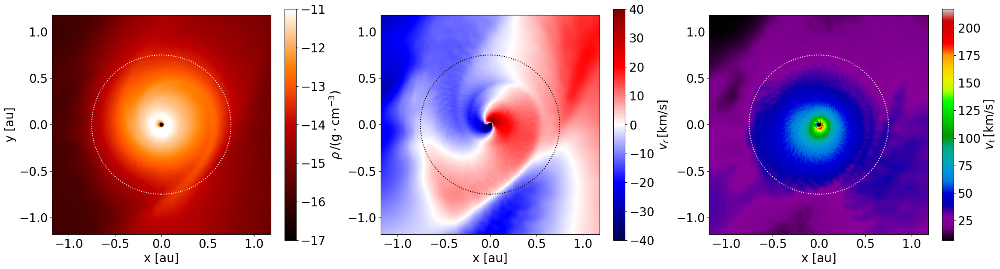

In [7]:
## Example for one circular model:
model  = 'v10e00'
run    = '/lhome/jolienm/Documents/TierModels/R_Aql/cooling/binariesInPaper/finalAccrDisks/'+str(model)+'_T3000_res8_racc01/'
dump   = 292
dumpData,setup = loadDataForSmoothing(run,dump)        
r      = 0.75
zoom   = 12
smooth = calcSmoothVtVrRho(zoom,dumpData,setup)
plot_vrvtRho(smooth,zoom,run,dump,r)


--------------------------------------------------------------
The following user settings will be loaded from /lhome/jolienm/Documents/GitHub/SPH_plotting_pipeline/src/plons/userSettings.txt

prefix = wind
data_location = /lhome/jolienm/Documents/TierModels/ 
pipeline_output_location = /lhome/jolienm/Documents/TierModels/outputPipeline 
hard_path_to_phantom = /lhome/jolienm/Documents/phantomRadTr 
--------------------------------------------------------------

theta rotation is  [-0.51088279]


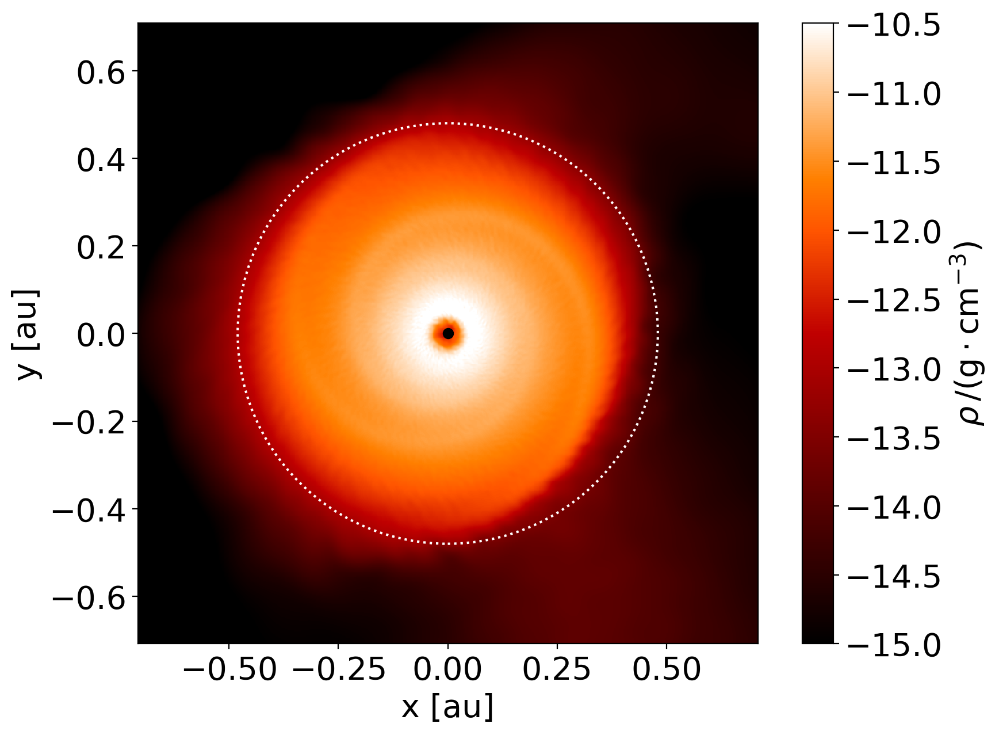

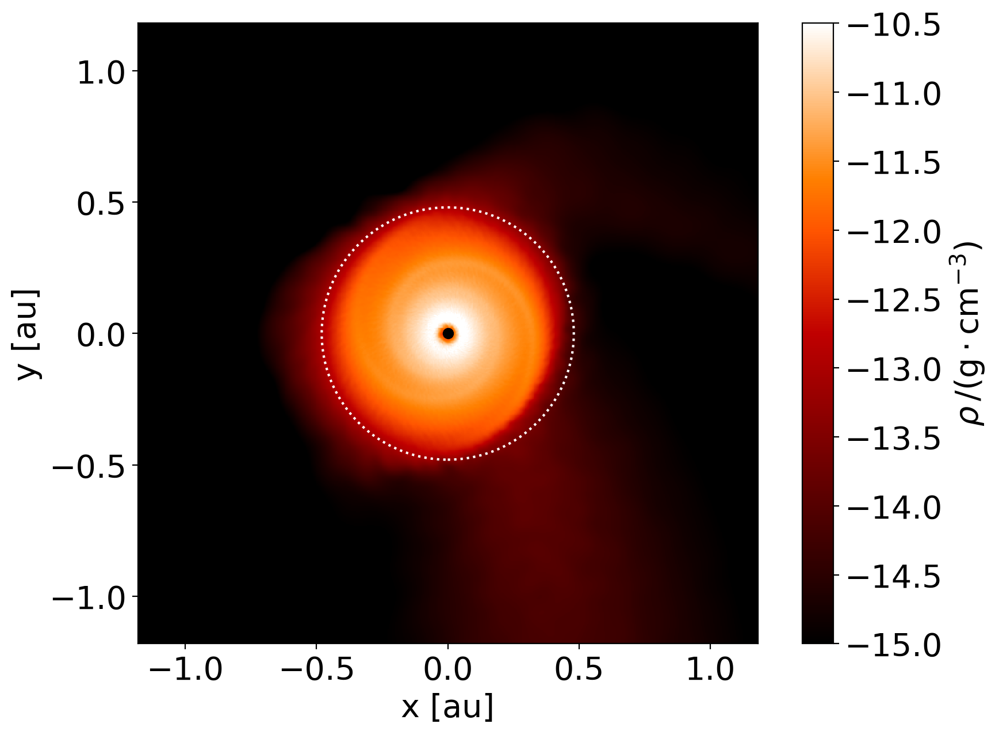


--------------------------------------------------------------
The following user settings will be loaded from /lhome/jolienm/Documents/GitHub/SPH_plotting_pipeline/src/plons/userSettings.txt

prefix = wind
data_location = /lhome/jolienm/Documents/TierModels/ 
pipeline_output_location = /lhome/jolienm/Documents/TierModels/outputPipeline 
hard_path_to_phantom = /lhome/jolienm/Documents/phantomRadTr 
--------------------------------------------------------------

theta rotation is  [3.072449]


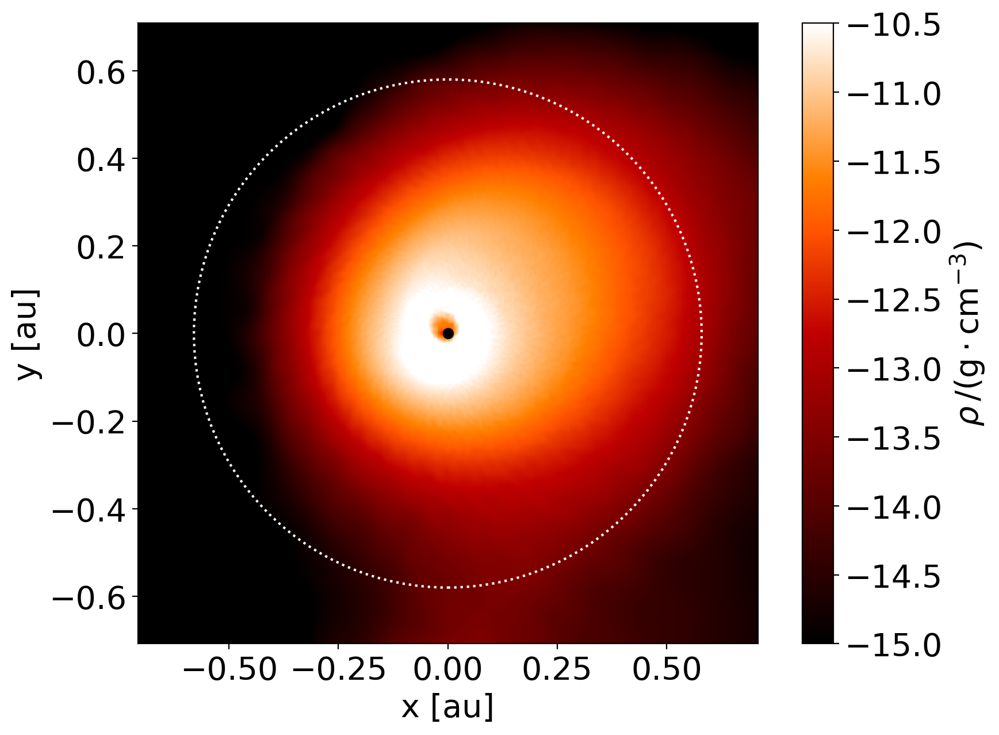

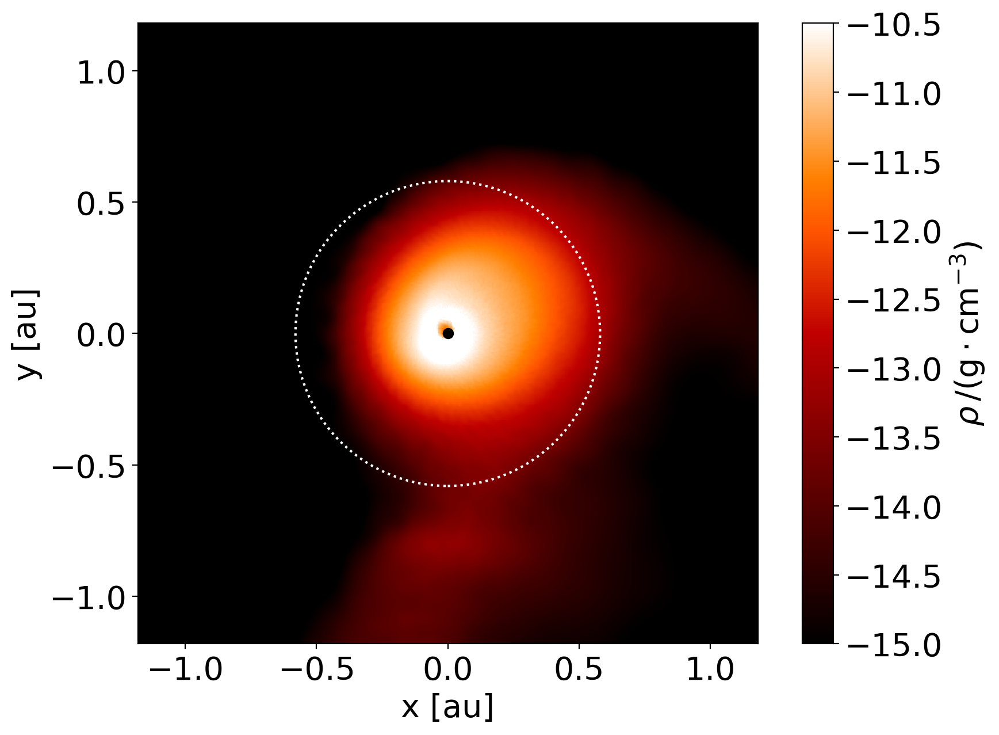


--------------------------------------------------------------
The following user settings will be loaded from /lhome/jolienm/Documents/GitHub/SPH_plotting_pipeline/src/plons/userSettings.txt

prefix = wind
data_location = /lhome/jolienm/Documents/TierModels/ 
pipeline_output_location = /lhome/jolienm/Documents/TierModels/outputPipeline 
hard_path_to_phantom = /lhome/jolienm/Documents/phantomRadTr 
--------------------------------------------------------------

theta rotation is  [0.72149766]


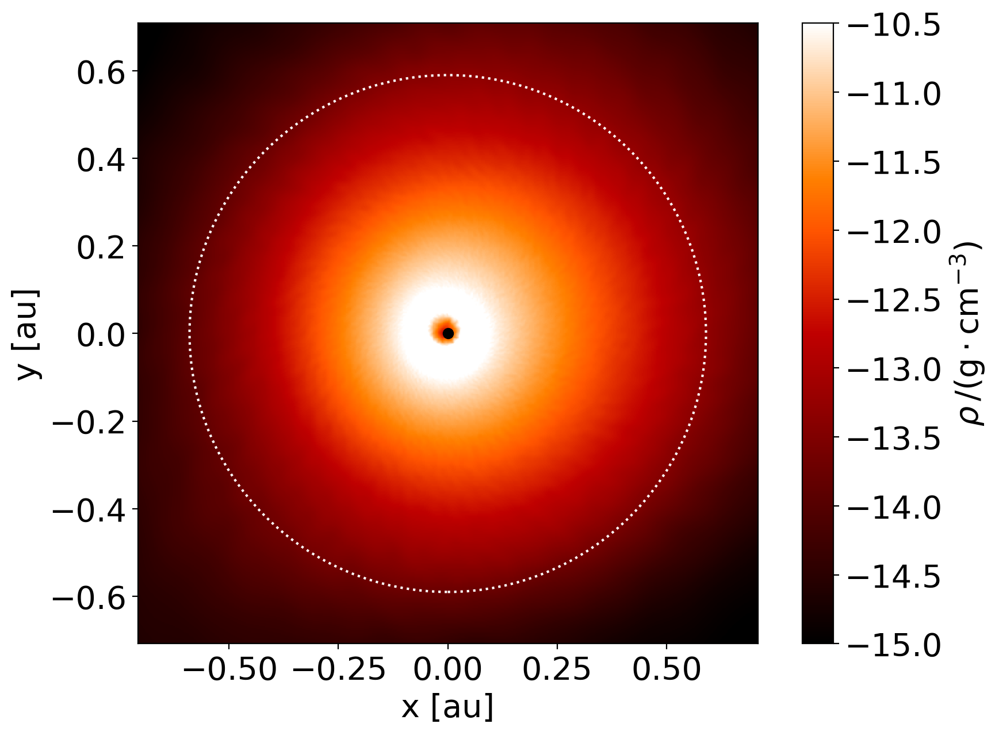

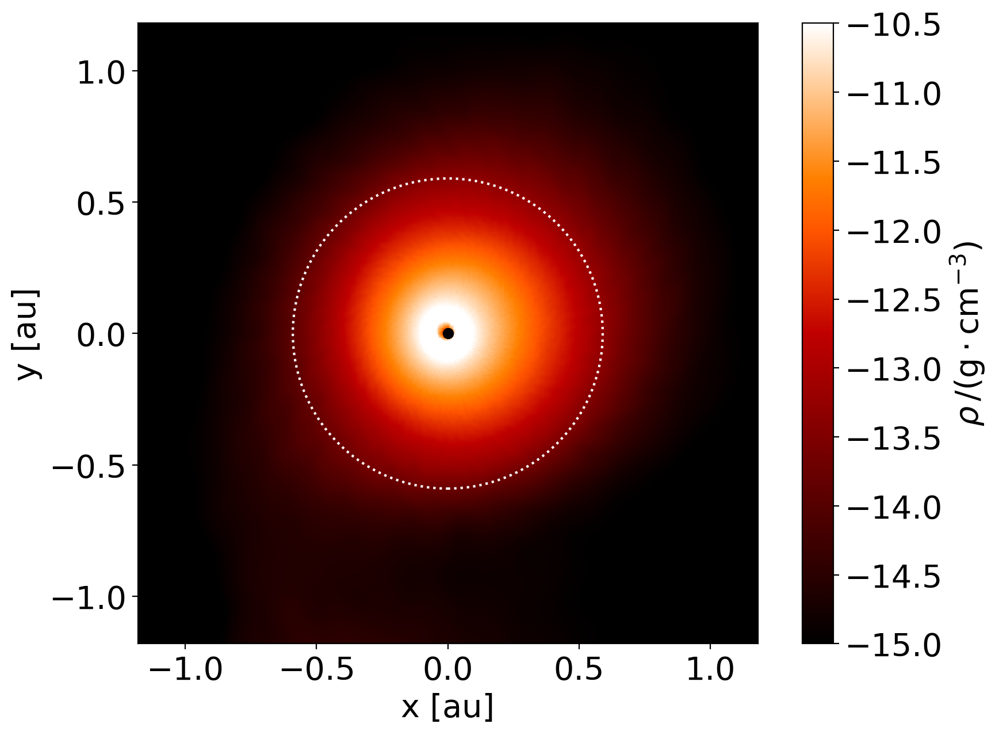


--------------------------------------------------------------
The following user settings will be loaded from /lhome/jolienm/Documents/GitHub/SPH_plotting_pipeline/src/plons/userSettings.txt

prefix = wind
data_location = /lhome/jolienm/Documents/TierModels/ 
pipeline_output_location = /lhome/jolienm/Documents/TierModels/outputPipeline 
hard_path_to_phantom = /lhome/jolienm/Documents/phantomRadTr 
--------------------------------------------------------------

theta rotation is  [0.00067087]


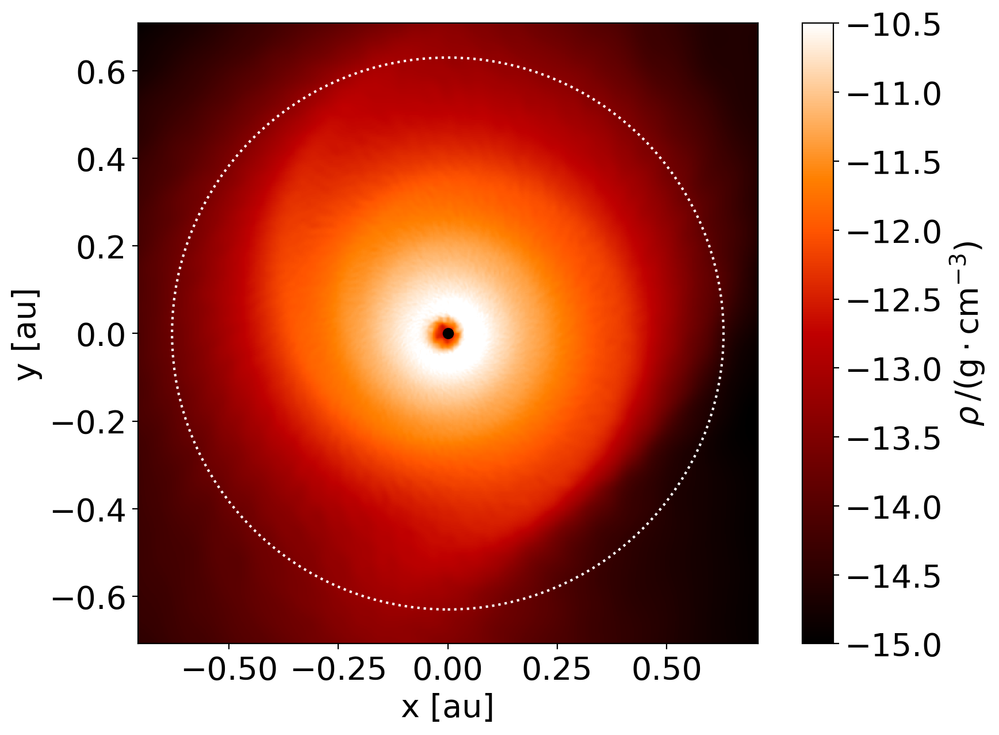

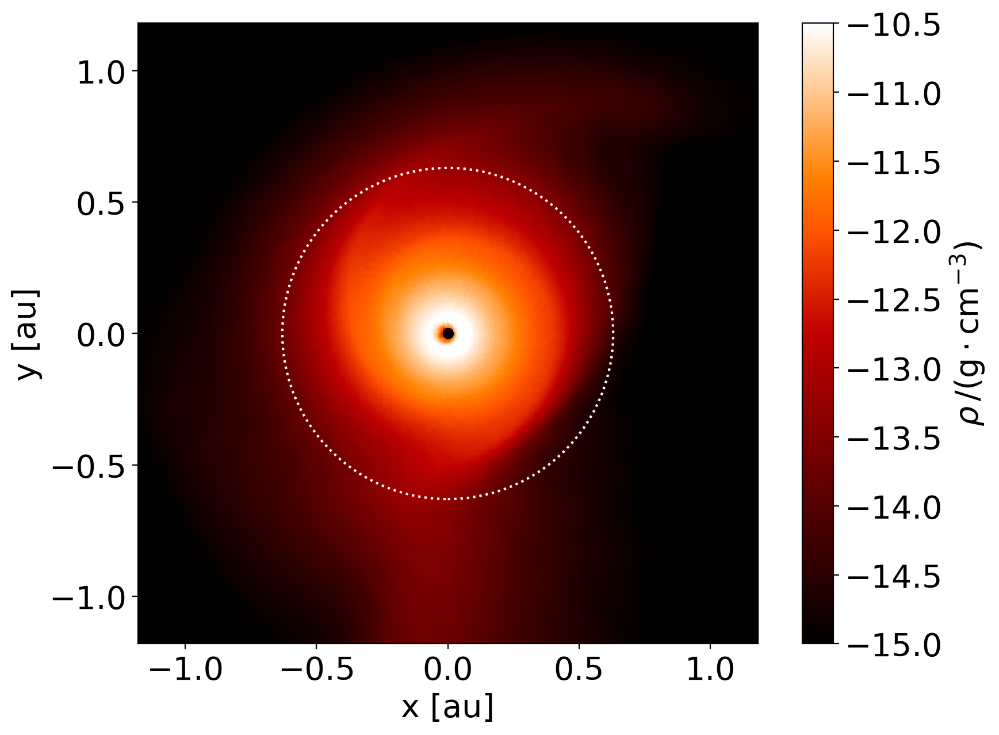


--------------------------------------------------------------
The following user settings will be loaded from /lhome/jolienm/Documents/GitHub/SPH_plotting_pipeline/src/plons/userSettings.txt

prefix = wind
data_location = /lhome/jolienm/Documents/TierModels/ 
pipeline_output_location = /lhome/jolienm/Documents/TierModels/outputPipeline 
hard_path_to_phantom = /lhome/jolienm/Documents/phantomRadTr 
--------------------------------------------------------------

theta rotation is  [-0.51089652]


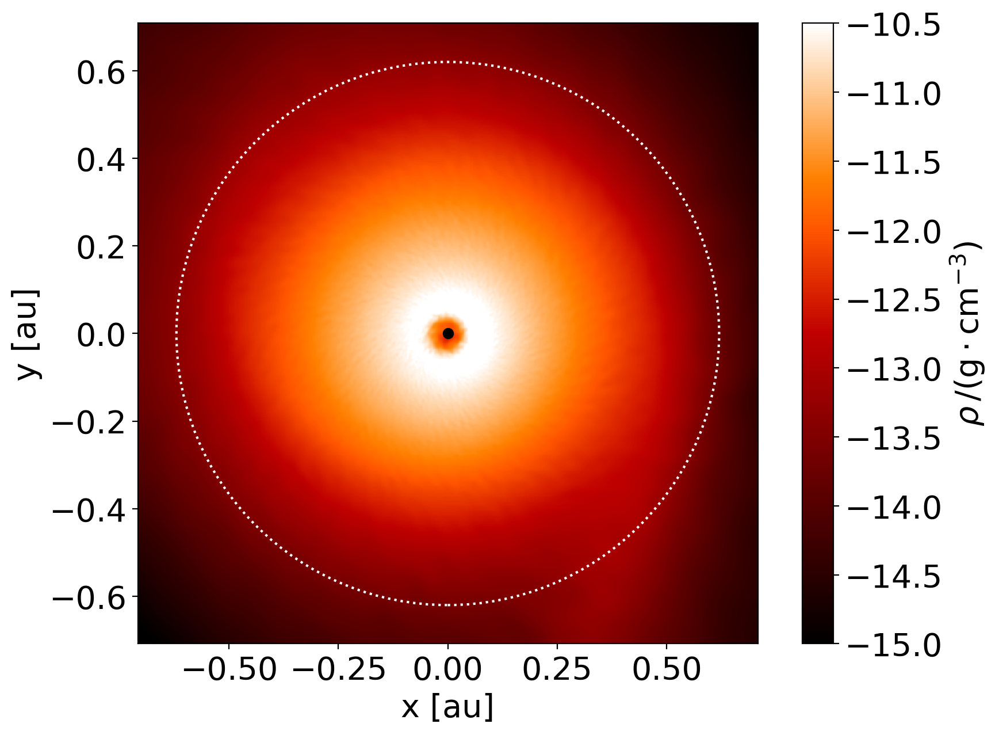

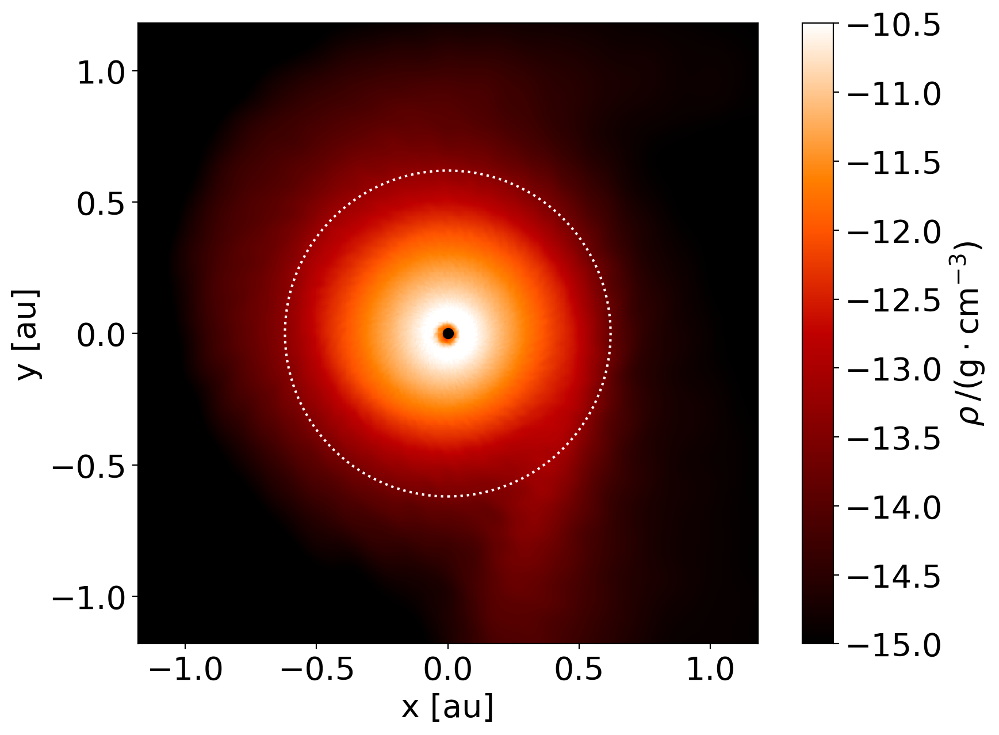


--------------------------------------------------------------
The following user settings will be loaded from /lhome/jolienm/Documents/GitHub/SPH_plotting_pipeline/src/plons/userSettings.txt

prefix = wind
data_location = /lhome/jolienm/Documents/TierModels/ 
pipeline_output_location = /lhome/jolienm/Documents/TierModels/outputPipeline 
hard_path_to_phantom = /lhome/jolienm/Documents/phantomRadTr 
--------------------------------------------------------------

theta rotation is  [3.07236299]


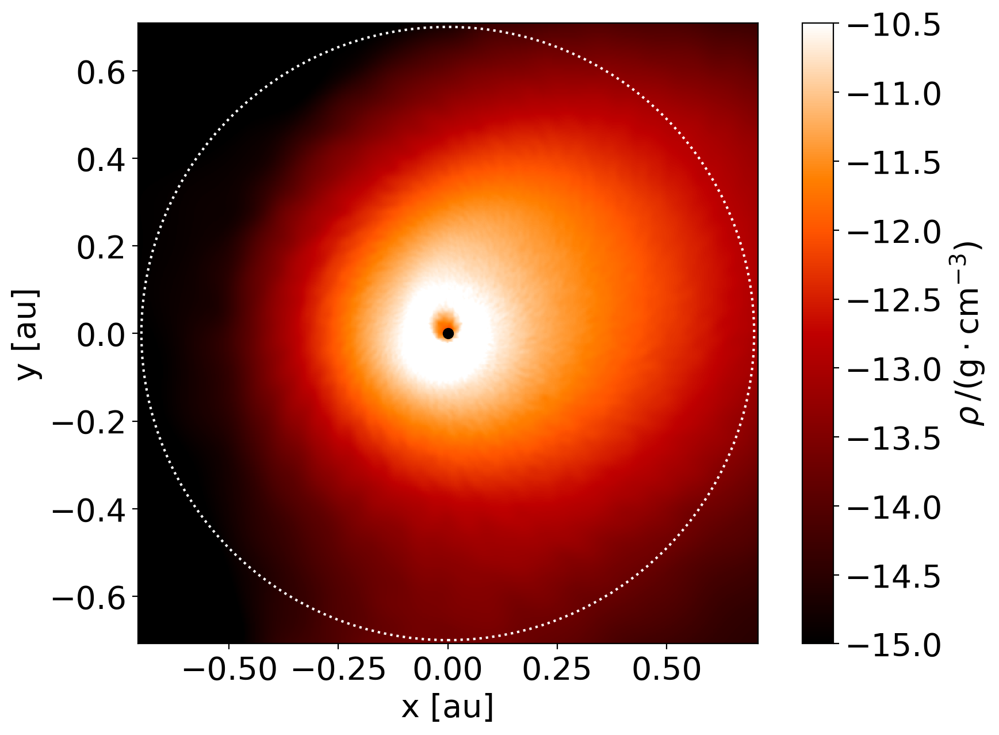

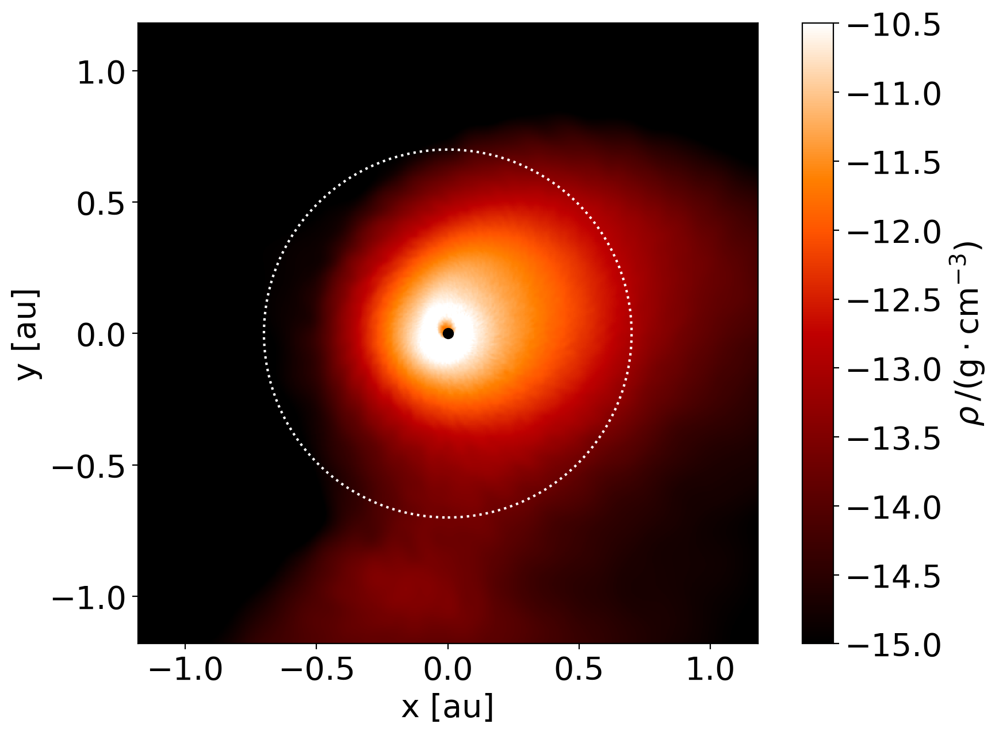


--------------------------------------------------------------
The following user settings will be loaded from /lhome/jolienm/Documents/GitHub/SPH_plotting_pipeline/src/plons/userSettings.txt

prefix = wind
data_location = /lhome/jolienm/Documents/TierModels/ 
pipeline_output_location = /lhome/jolienm/Documents/TierModels/outputPipeline 
hard_path_to_phantom = /lhome/jolienm/Documents/phantomRadTr 
--------------------------------------------------------------

theta rotation is  [0.72147953]


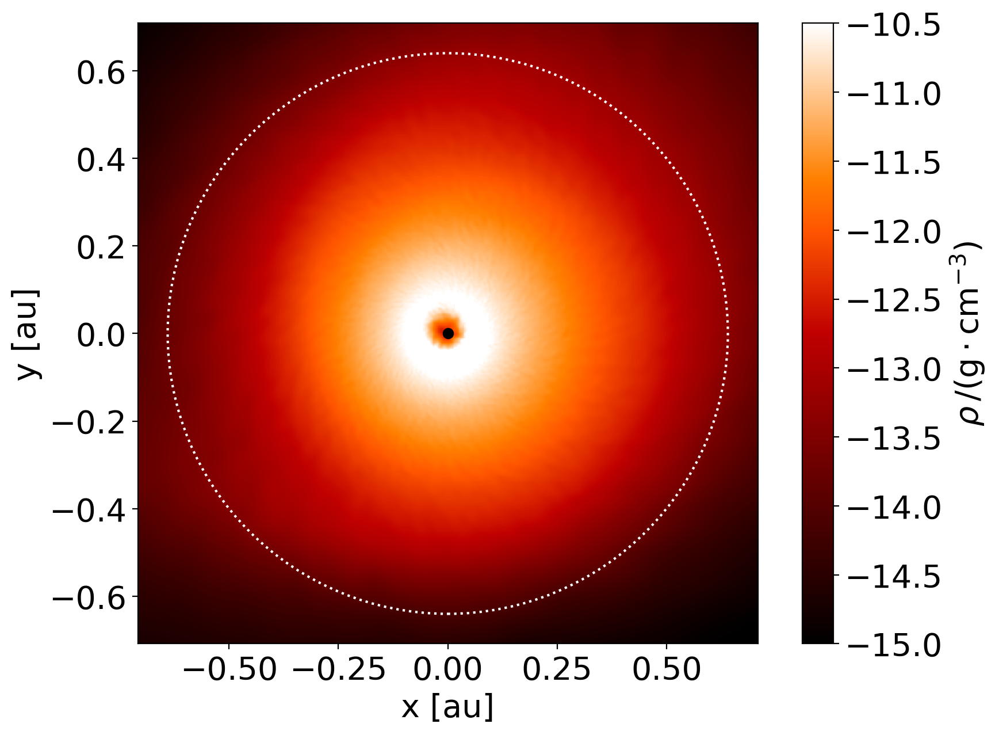

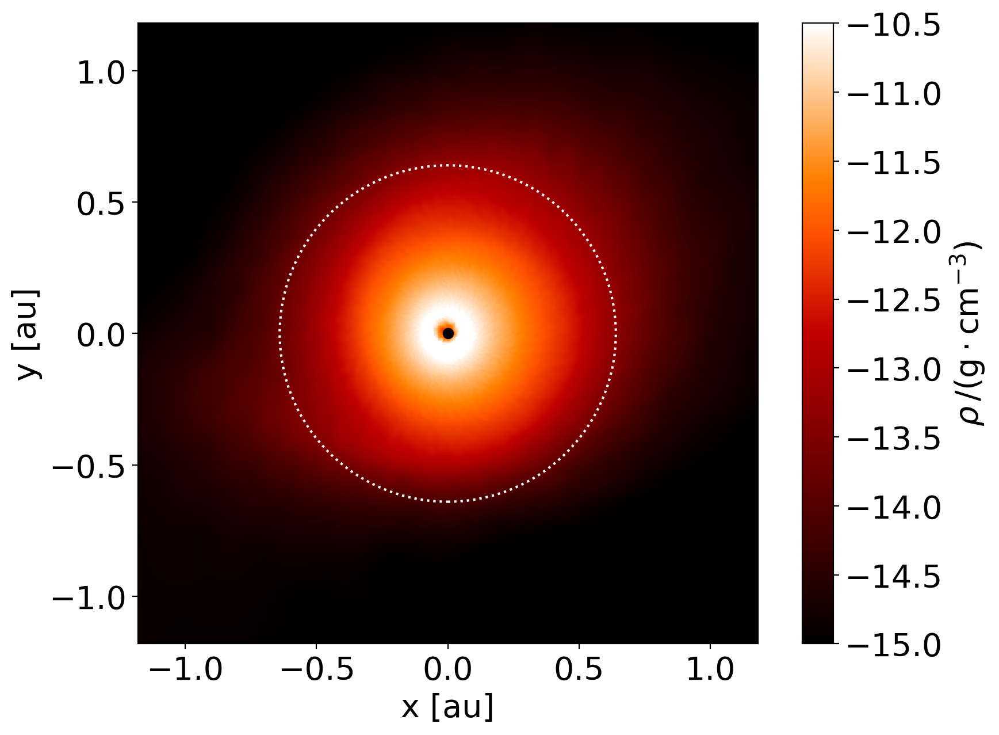


--------------------------------------------------------------
The following user settings will be loaded from /lhome/jolienm/Documents/GitHub/SPH_plotting_pipeline/src/plons/userSettings.txt

prefix = wind
data_location = /lhome/jolienm/Documents/TierModels/ 
pipeline_output_location = /lhome/jolienm/Documents/TierModels/outputPipeline 
hard_path_to_phantom = /lhome/jolienm/Documents/phantomRadTr 
--------------------------------------------------------------

theta rotation is  [0.00065546]


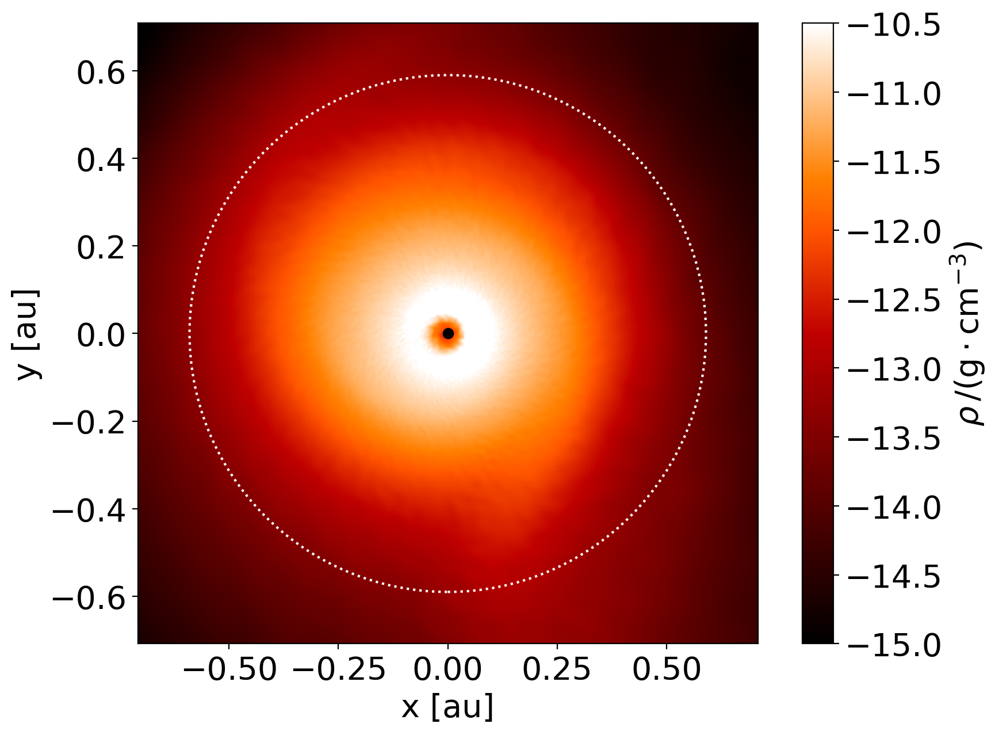

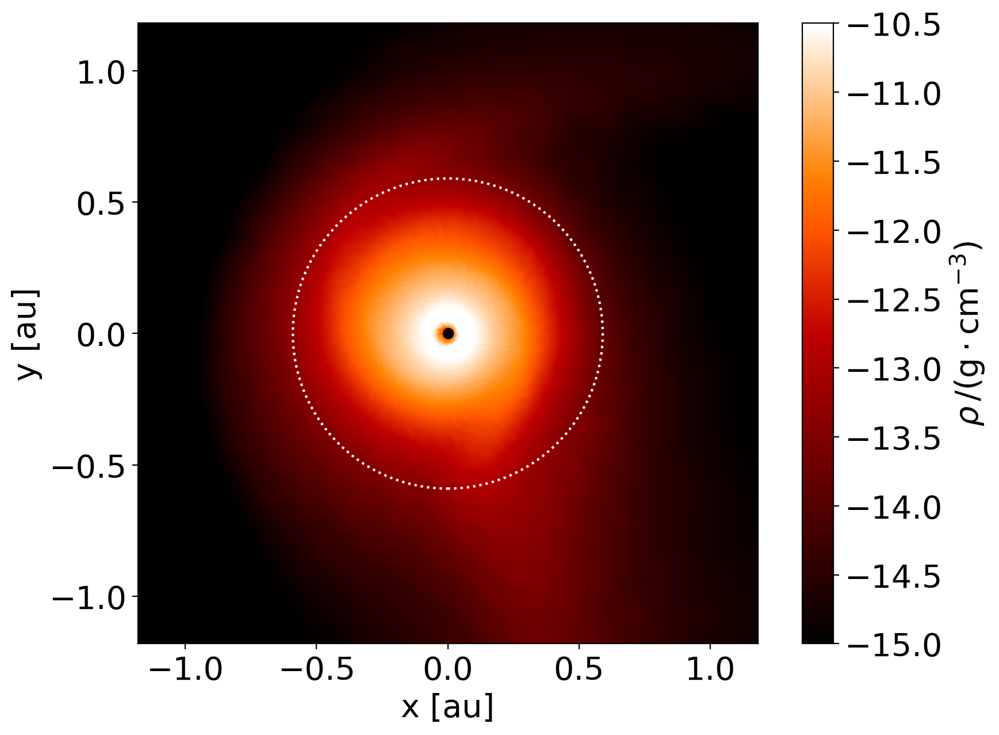

In [29]:
## Example: all eccentric models, 4 different dumps, 4 zoom

%matplotlib inline 
models = ['v20e50']
dumps  = [250,266,277,292]
rs     = [0.44,0.37,0.5,0.41]
zoomChoices = [20,12,8.5,2]
for model in models:
    run    = '/lhome/jolienm/Documents/TierModels/R_Aql/cooling/binariesInPaper/finalAccrDisks/'+str(model)+'_T3000_res8_racc01/'
    i = 0
    for dump in dumps:
        dumpData,setup = loadDataForSmoothing(run,dump)        
        r = rs[i]
        i = i+1
        for zoom in zoomChoices:
            smooth = calcSmoothVtVrRho(zoom,dumpData,setup)
            plot_vrvtRho(smooth,zoom,run,dump,r)

models = ['v10e50']
dumps  = [245,263,277,292]
rs     = [0.48,0.58,0.59,0.63]
zoomChoices = [20,12,8.5,2]
zoomChoices = []
for model in models:
    run    = '/lhome/jolienm/Documents/TierModels/R_Aql/cooling/binariesInPaper/finalAccrDisks/'+str(model)+'_T3000_res8_racc01/'
    i = 0
    for dump in dumps:
        dumpData,setup = loadDataForSmoothing(run,dump)
        r = rs[i]
        i = i+1
        for zoom in zoomChoices:
            smooth = calcSmoothVtVrRho(zoom,dumpData,setup)
            plot_vrvtRho(smooth,zoom,run,dump,r)
            
                        
models = ['v05e50']
dumps  = [245,263,277,292]
rs     = [0.62,0.70,0.64,0.59]
zoomChoices = [20,12,8.5,2]
for model in models:
    run    = 'R_Aql/cooling/binariesInPaper/finalAccrDisks/'+str(model)+'_T3000_res8_racc01/'
    i = 0
    for dump in dumps:
        dumpData,setup = loadDataForSmoothing(run,dump)
        r = rs[i]
        i = i+1
        for zoom in zoomChoices:
            smooth = calcSmoothVtVrRho(zoom,dumpData,setup)
            plot_vrvtRho(smooth,zoom,run,dump,r)



--------------------------------------------------------------
The following user settings will be loaded from /lhome/jolienm/Documents/GitHub/SPH_plotting_pipeline/src/plons/userSettings.txt

prefix = wind
data_location = /lhome/jolienm/Documents/TierModels/ 
pipeline_output_location = /lhome/jolienm/Documents/TierModels/outputPipeline 
hard_path_to_phantom = /lhome/jolienm/Documents/phantomRadTr 
--------------------------------------------------------------

theta rotation is  [0.00172885]
vx,vy,vz companion:  0.019965103563259673 11.535488135345183 -4.68015514955458e-10
theta rotation is  [0.00172885]


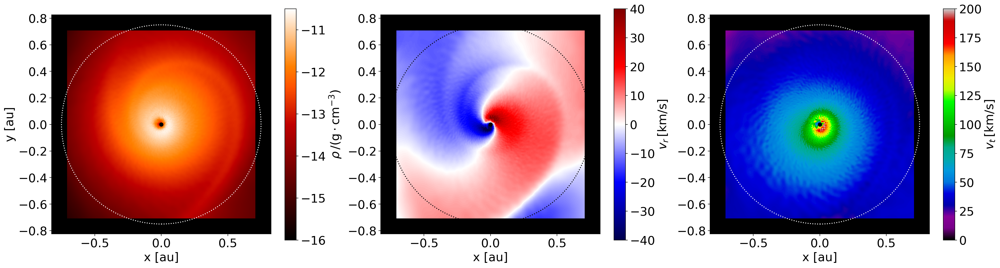

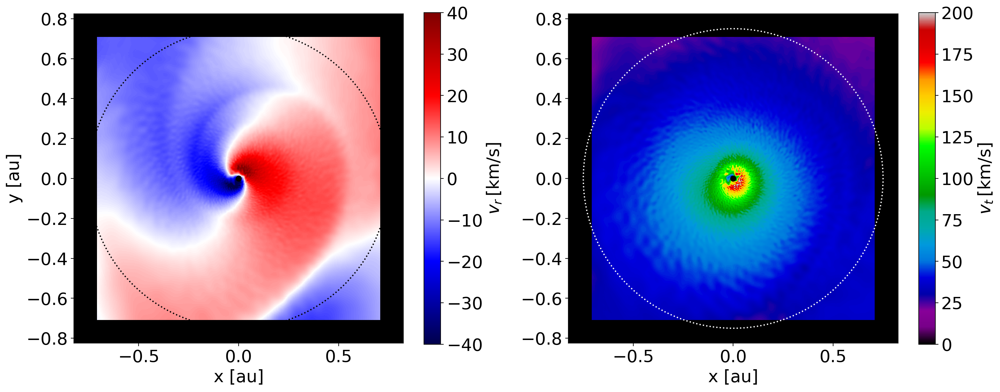

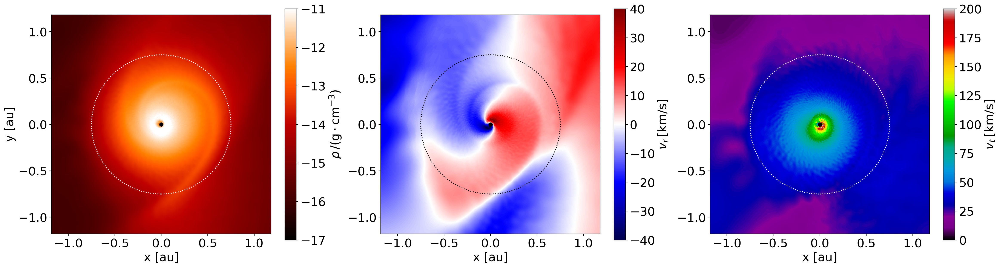

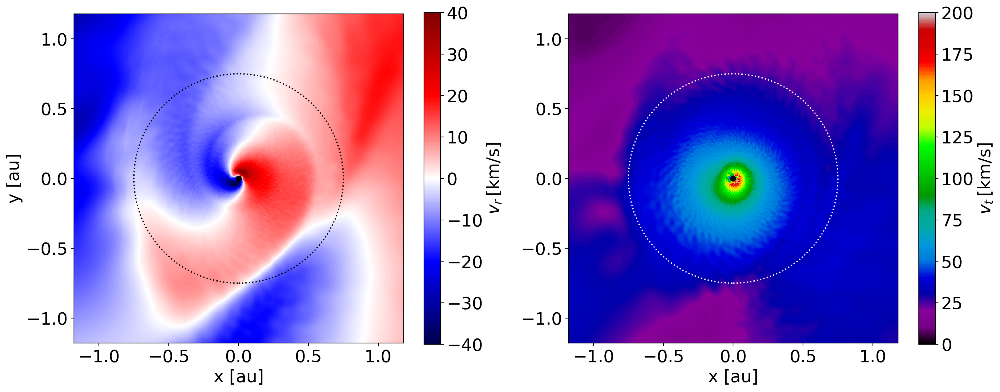

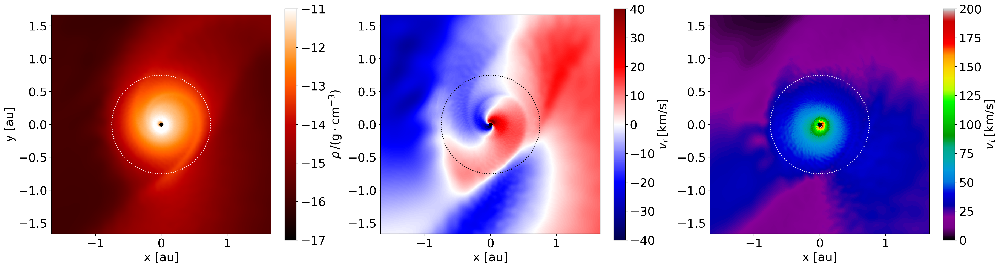

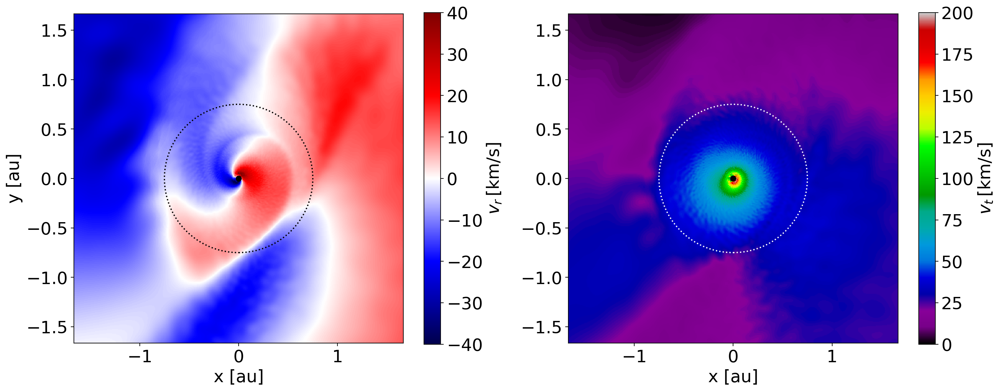

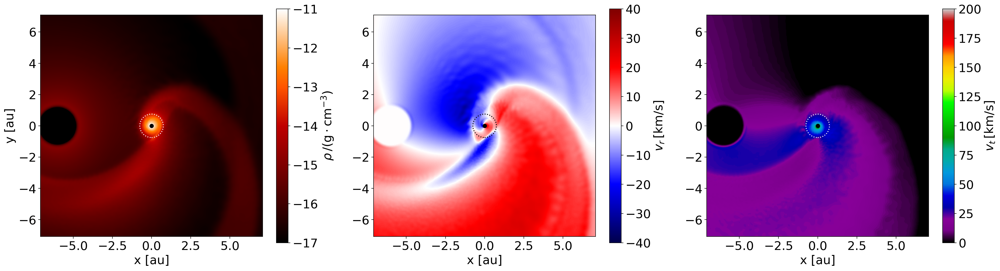

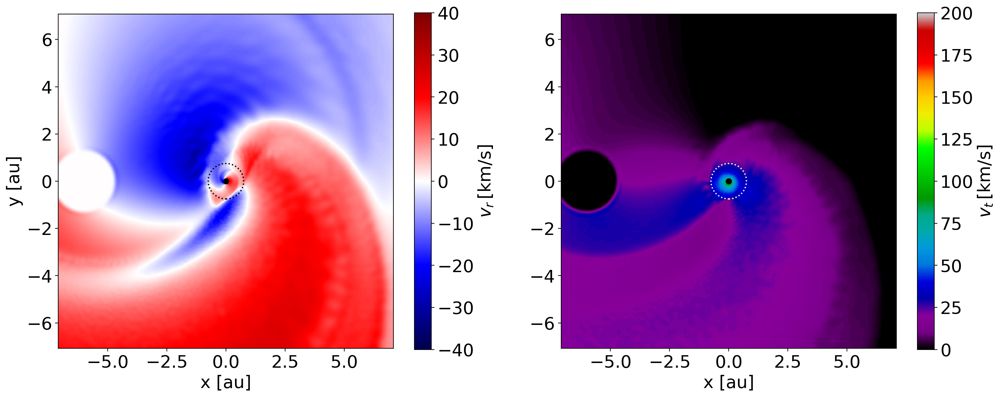


--------------------------------------------------------------
The following user settings will be loaded from /lhome/jolienm/Documents/GitHub/SPH_plotting_pipeline/src/plons/userSettings.txt

prefix = wind
data_location = /lhome/jolienm/Documents/TierModels/ 
pipeline_output_location = /lhome/jolienm/Documents/TierModels/outputPipeline 
hard_path_to_phantom = /lhome/jolienm/Documents/phantomRadTr 
--------------------------------------------------------------

theta rotation is  [0.00169469]
vx,vy,vz companion:  0.019566557734621275 11.535500516134825 -3.565392381380162e-09
theta rotation is  [0.00169469]


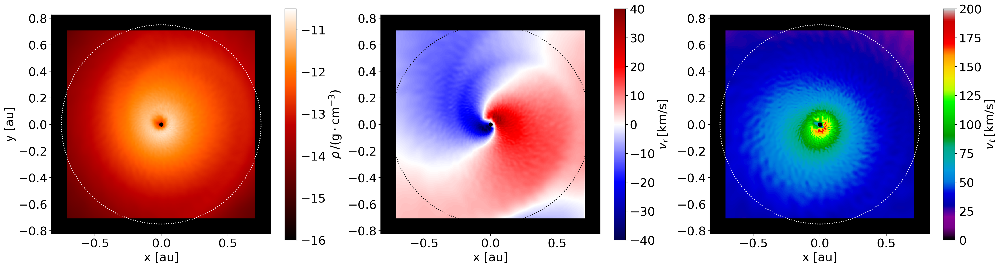

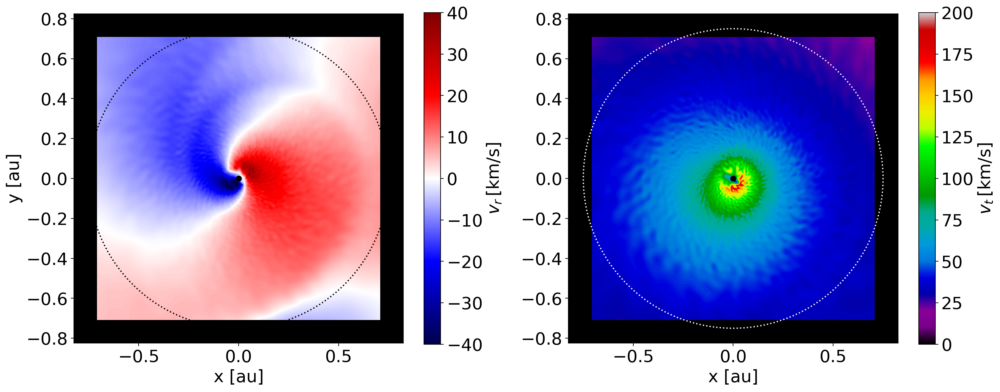

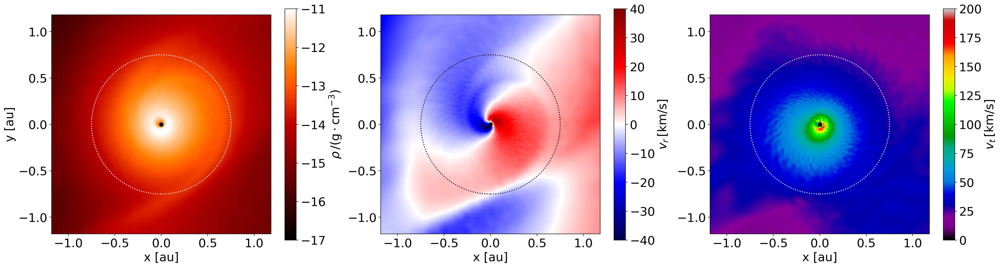

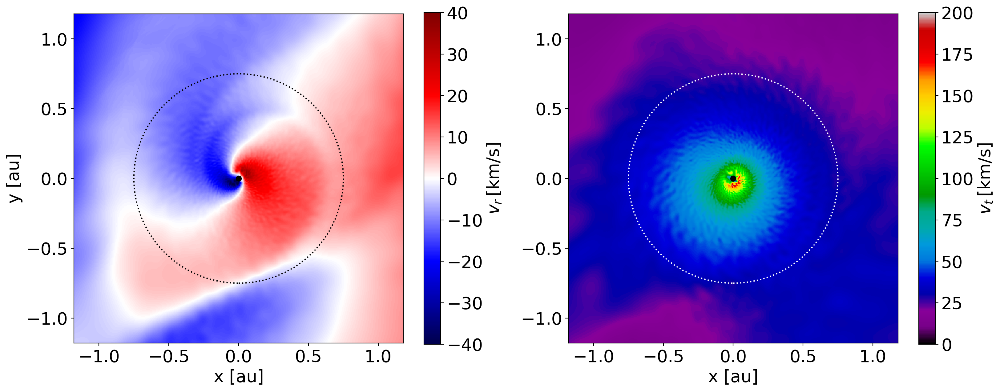

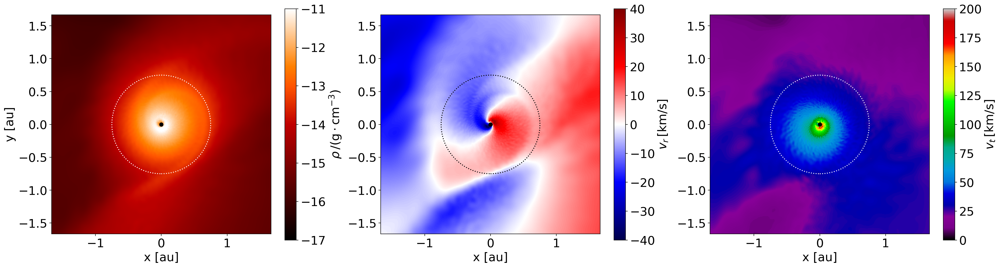

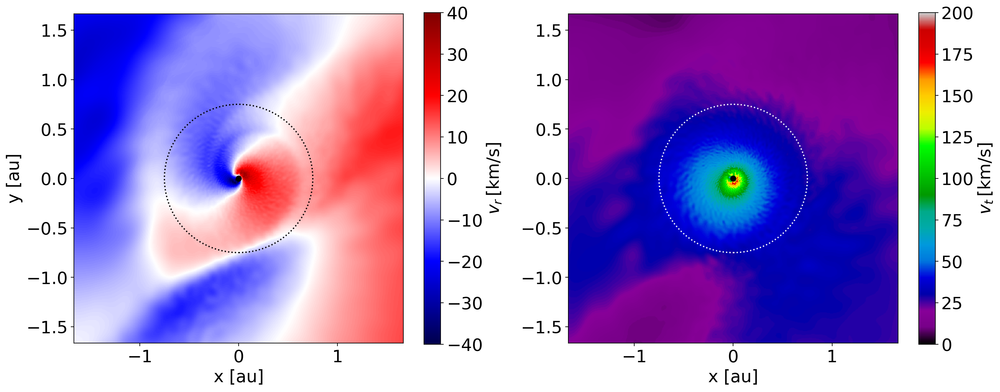

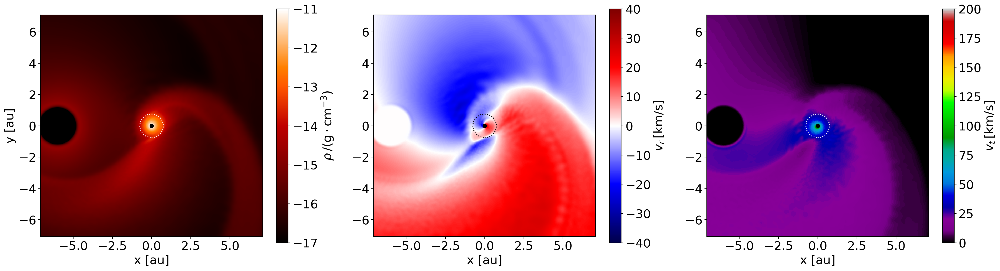

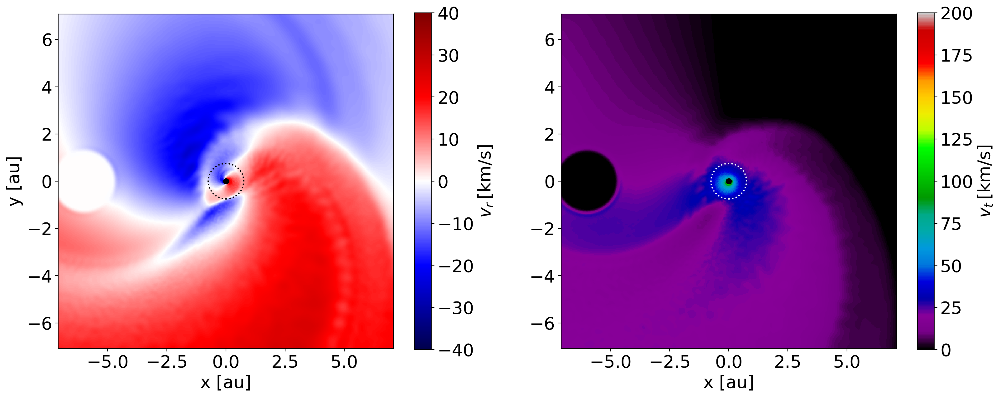


--------------------------------------------------------------
The following user settings will be loaded from /lhome/jolienm/Documents/GitHub/SPH_plotting_pipeline/src/plons/userSettings.txt

prefix = wind
data_location = /lhome/jolienm/Documents/TierModels/ 
pipeline_output_location = /lhome/jolienm/Documents/TierModels/outputPipeline 
hard_path_to_phantom = /lhome/jolienm/Documents/phantomRadTr 
--------------------------------------------------------------

theta rotation is  [0.00175844]
vx,vy,vz companion:  0.02029471966576962 11.535481393852807 7.522243324136274e-11
theta rotation is  [0.00175844]


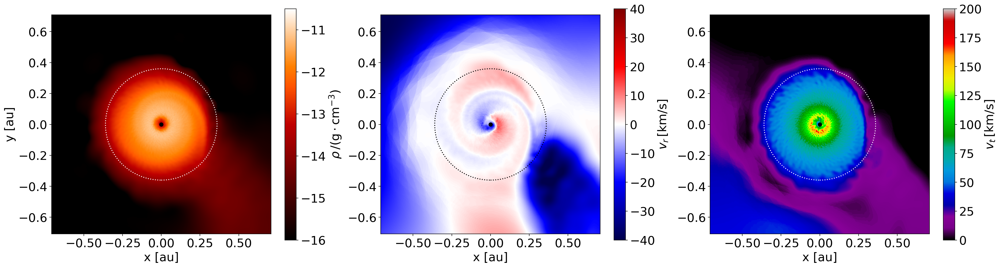

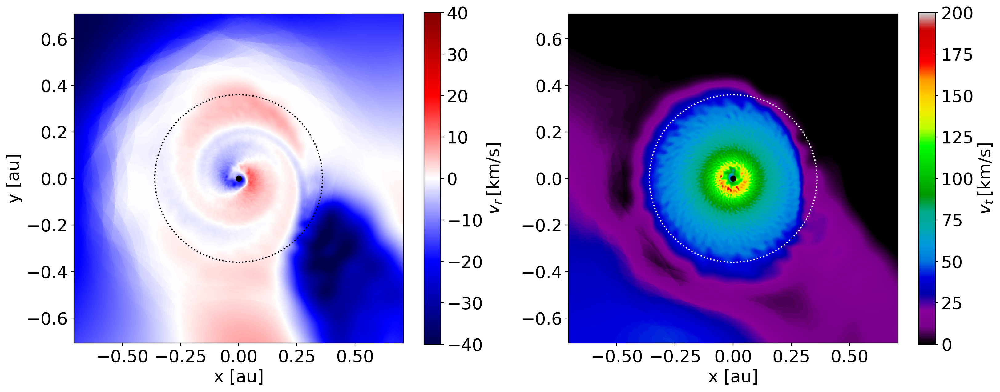

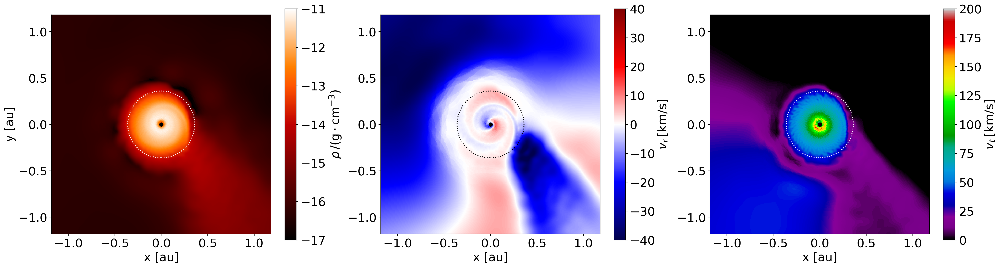

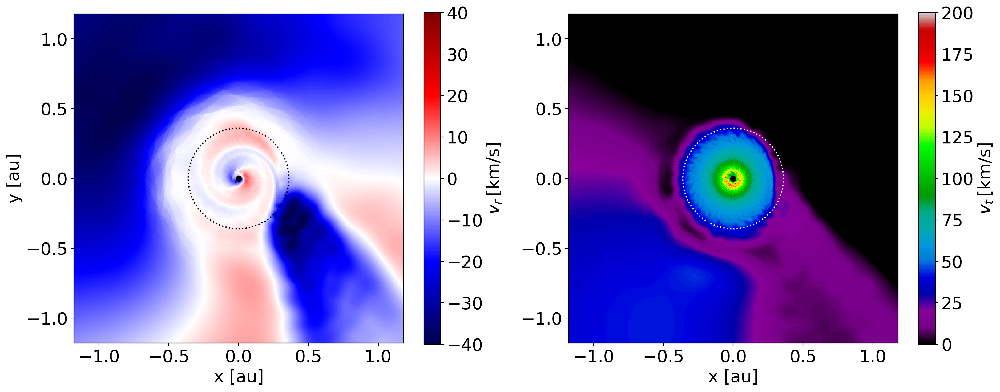

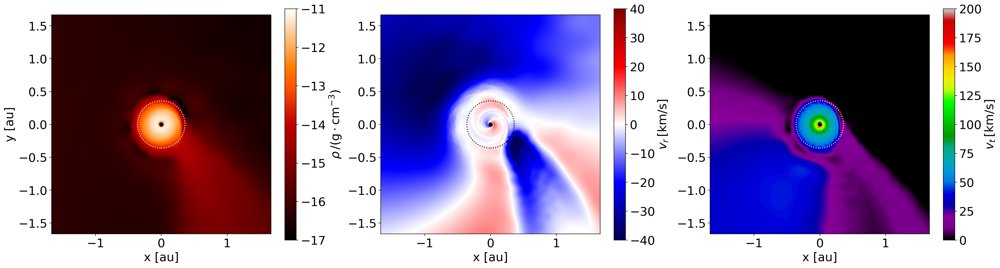

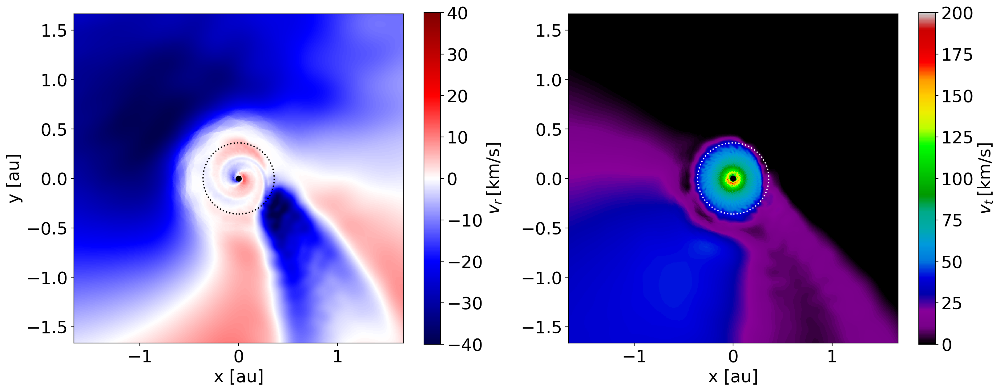

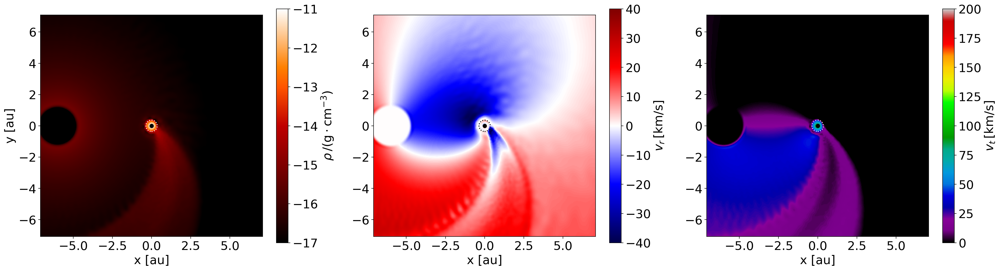

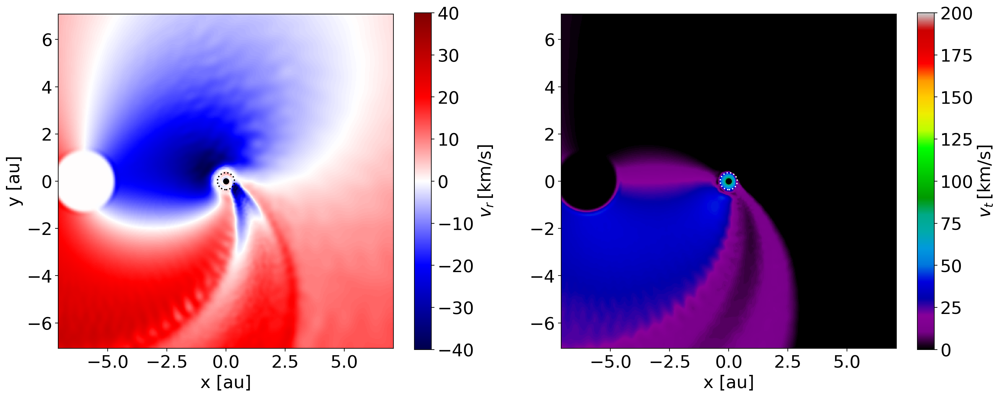

In [27]:
## Example: all circular models, 1 dump, 4 different zoom

%matplotlib inline 

# Load data and calculate smoothened data for sliceplots
dump = 292
models = ['v10e00','v05e00','v20e00']
zoomChoices = [20,12,8.5,2]

for model in models:
    if model == 'v20e00':
        r = 0.36
    elif model == 'v10e00':
        r = 0.75
    elif model == 'v10e00':
        r = 0.94
    run    = 'R_Aql/cooling/binariesInPaper/finalAccrDisks/'+str(model)+'_T3000_res8_racc01/'
    dumpData,setup = loadDataForSmoothing(run,dump)
    for zoom in zoomChoices:
        smooth = calcSmoothVtVrRho(zoom,dumpData,setup)
        plot_vrvtRho(smooth,zoom,run,dump,r)

        
# zoom  = 20        # for v20e00                          ----> Z1
# zoom = 12         # for v05e00 and v10e00               ----> Z2
# zoom = 8.5        # correct for v05e00 and v10e00       ----> Z3
# zoom = 3                                              # ----> Z10
# zoom = 2                                              # ----> Z15